**Important Notes:**
1. Folders containing the splited data (train, test and validate) cab be downloaded from https://drive.google.com/file/d/1GDP1JyGMXI6xUAmWQ6Ox2BnibC8Jl_7w/view?usp=share_link
- Due to the size limitations, the original kaggle data set has been removed.
- If you want to do the data split again, please do NOT download this folder and do start from the very beginning
- The downloaded dataset can be extracted to the same folder as the yolov5.ipynb

2. The yolov5 folder can be downloaded from https://drive.google.com/file/d/1anjvuNXw6DYLpxumzH-XLax1T-PgsuRq/view?usp=share_link
- This yolov5 folder contains all of the results, including best.pt, detected images and etc
- Yolov5 fold should be extracted to the same folder as the yolov5.ipynb

3. COTS.yaml file can be downloaded from https://drive.google.com/file/d/1HV-kEsbw0FnLLrDcNZUQ_5NgLLhU9dtJ/view?usp=share_link

4. If you decide to use the splited dataset (which means you do not want to download the original dataset from kaggle), directly jump to the model training part, for all data has been splited and there is no more data to filter or split. If you have downloaded folders from the above, the final structure should be like this:

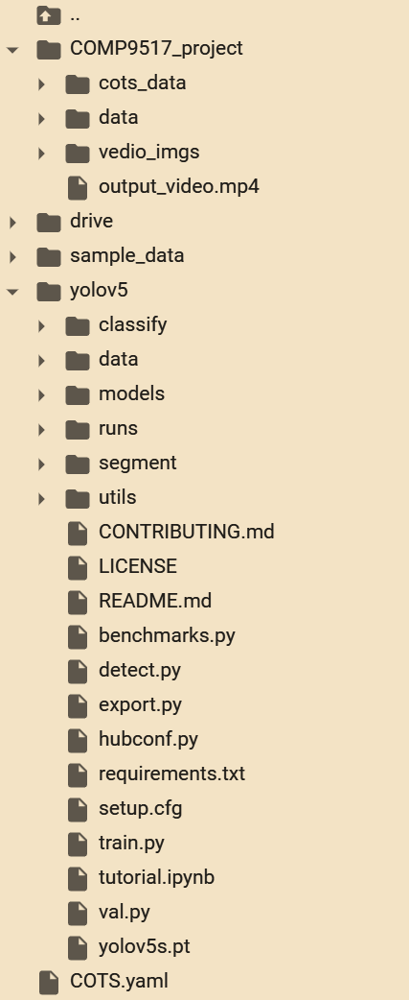 

5. If you decide to run the notebook from the very beginning, do NOT download any files from the above links.

## COMP9517 Project
### Counting COTS(Crown-of-thorns starfish)
- A picture of COTS form wikipedia: <br>
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/3f/Acanthaster_planci%2C_%C3%A9toiles_mangeuses_de_corail.jpeg/440px-Acanthaster_planci%2C_%C3%A9toiles_mangeuses_de_corail.jpeg" alt="alt text" title="image Title" width="400"/>
- Goals:
    - **Detect** and **Count** COTS

#### Download data from kaggle
1. data stores in `COMP9517_project/kaggle_data`

In [1]:
!pip install -q kaggle

- Add your kaggle.json here

In [2]:
from google.colab import files
files.upload()   

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"gambitwister","key":"a5b7324a61fa8fbe4fdaa885e2f8ffb6"}'}

In [3]:
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

rm: cannot remove '/root/.kaggle': No such file or directory
ref                                                             title                                       size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  -----------------------------------------  -----  -------------------  -------------  ---------  ---------------  
akshaydattatraykhare/diabetes-dataset                           Diabetes Dataset                             9KB  2022-10-06 08:55:25          12948        409  1.0              
whenamancodes/covid-19-coronavirus-pandemic-dataset             COVID -19 Coronavirus Pandemic Dataset      11KB  2022-09-30 04:05:11          10239        318  1.0              
thedevastator/240000-household-electricity-consumption-records  Household Electricity Consumption            3MB  2022-10-24 01:22:40            864         27  1.0              
akshaydattatraykhare/data-for-admission-in-t

In [4]:
!kaggle competitions download -c tensorflow-great-barrier-reef

100% 14.2G/14.2G [11:03<00:00, 24.6MB/s]
100% 14.2G/14.2G [11:03<00:00, 23.0MB/s]


In [6]:
!mkdir COMP9517_project
!mkdir COMP9517_project/kaggle_data
!unzip tensorflow-great-barrier-reef.zip -d COMP9517_project/kaggle_data

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4303.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4304.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4305.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4306.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4307.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4308.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4309.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/431.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4310.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4311.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4312.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4313.jpg  
  inflating: COMP9517_project/kaggle_data/train_images/video_2/4314.jpg  
  inflating:

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Note: this part is to download the completed COMP9517_project folder, which contains the splited train, test and validate data. 

You just need to download from the link provided at the top.

In [3]:
!unzip drive/MyDrive/COMP9517_project.zip

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: COMP9517_project/cots_data/images/val/1-3941.jpg  
  inflating: COMP9517_project/cots_data/images/val/0-12307.jpg  
  inflating: COMP9517_project/cots_data/images/val/0-4754.jpg  
  inflating: COMP9517_project/cots_data/images/val/1-1997.jpg  
  inflating: COMP9517_project/cots_data/images/val/1-4526.jpg  
  inflating: COMP9517_project/cots_data/images/val/0-9376.jpg  
  inflating: COMP9517_project/cots_data/images/val/1-9237.jpg  
  inflating: COMP9517_project/cots_data/images/val/0-4554.jpg  
  inflating: COMP9517_project/cots_data/images/val/1-8866.jpg  
  inflating: COMP9517_project/cots_data/images/val/1-8993.jpg  
  inflating: COMP9517_project/cots_data/images/val/0-9891.jpg  
  inflating: COMP9517_project/cots_data/images/val/2-4732.jpg  
  inflating: COMP9517_project/cots_data/images/val/2-5790.jpg  
  inflating: COMP9517_project/cots_data/images/val/0-4859.jpg  
  inflating: COMP9517_project/cots_data/images/val/2-5908.jpg  
  inflating:

Note: you just need to download COTS.yaml from the link at the top.

In [4]:
!cp drive/MyDrive/COTS.yaml ./COTS.yaml

#### Background
- Output a vedio to watch our goal and get familar with this little creature COTS :)
- Our output vedio is made of the first `sequence_frame` from 0 to 479

In [7]:
import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import ast
import numpy as np
import glob
import random

In [8]:
df = pd.read_csv("./COMP9517_project/kaggle_data/train.csv")
print(df.loc[479].at["sequence_frame"], df.loc[480].at["sequence_frame"])

479 0


- Create a folder `vedio_imgs` to store images with bbox which will later used to make the vedio. The origin images are from `./COMP9517_project/kaggle_data/train_images/video_0`, `0.jpg` to `479.jpg`

In [9]:
!rm -rf COMP9517_project/vedio_imgs
!mkdir COMP9517_project/vedio_imgs

In [10]:
color_list = []
for i in range(50):  
    annotations_list = ast.literal_eval(df.loc[i].at['annotations'])
    # print(f'{i} {annotations_list} {len(annotations_list)}')
    img = cv.imread('./COMP9517_project/kaggle_data/train_images/video_0/'+( "% s" % i)+'.jpg')
    if len(annotations_list) != 0:
        for annotation in annotations_list:
            # generate the random different color for each rectangle
            while True:
                r = random.randint(0, 255)
                g = random.randint(0, 255)
                b = random.randint(0, 255)
                color = [r, g, b]
                if color not in color_list:
                    color_list.append(color)
                    break
            x = annotation.get('x')
            y = annotation.get('y')
            w = annotation.get('width')
            h = annotation.get('width')
            cv.rectangle(img,(x,y),(x+w,y+h),color,2)
        cv.putText(img=img, text=f'{len(annotations_list)}', org=(150, 250), fontFace=cv.FONT_HERSHEY_TRIPLEX,
                   fontScale=5, color=(255,255,255), thickness=15)
        cv.imwrite(r'./COMP9517_project/vedio_imgs/'+( "% s" % i)+'.jpg', img)

In [32]:
color_list = []
# print(f'{i} {annotations_list} {len(annotations_list)}')
img = cv.imread('./COMP9517_project/cots_data/images/test/0-111.jpg')
# generate the random different color for each rectangle
while True:
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    color = [r, g, b]
    if color not in color_list:
        color_list.append(color)
        break
x = 649
y = 22
w = 23
h = 25
cv.rectangle(img,(x,y),(x+w,y+h),color,2)
cv.putText(img=img, text=f'1', org=(150, 250), fontFace=cv.FONT_HERSHEY_TRIPLEX,
            fontScale=5, color=(255,255,255), thickness=15)
cv.imwrite(r'./0-111.jpg', img)

True

- Generate a vedio file named `output_vedio.mp4` inside folder `COMP9517_project`

In [ ]:
frameSize = (1280, 720)

out = cv.VideoWriter('./COMP9517_project/output_video.mp4',cv.VideoWriter_fourcc(*'mp4v'), 2, frameSize)

for filename in glob.glob('./COMP9517_project/vedio_imgs/*.jpg'):
    img = cv.imread(filename)
    out.write(img)

out.release()

- Show some of the frames from the video

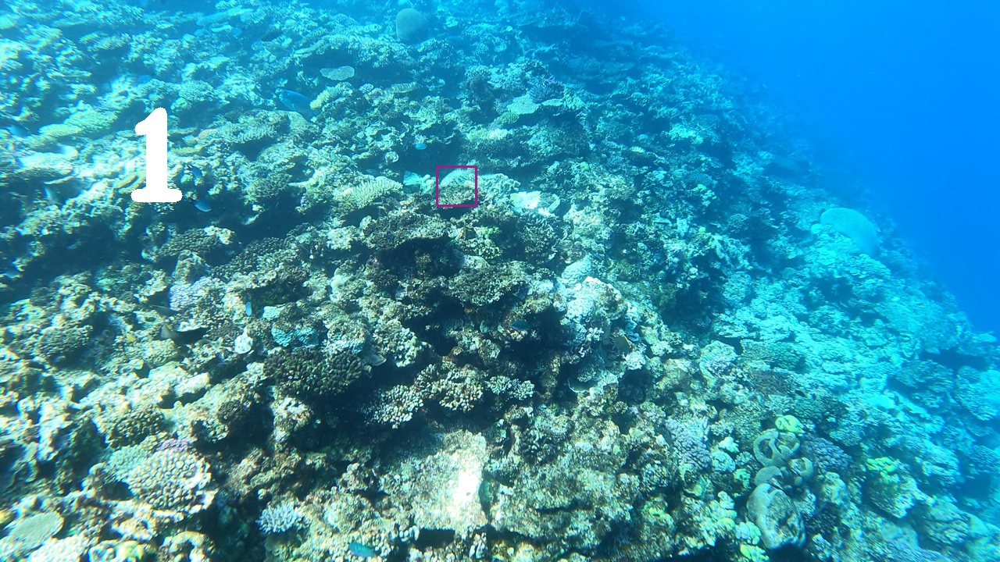

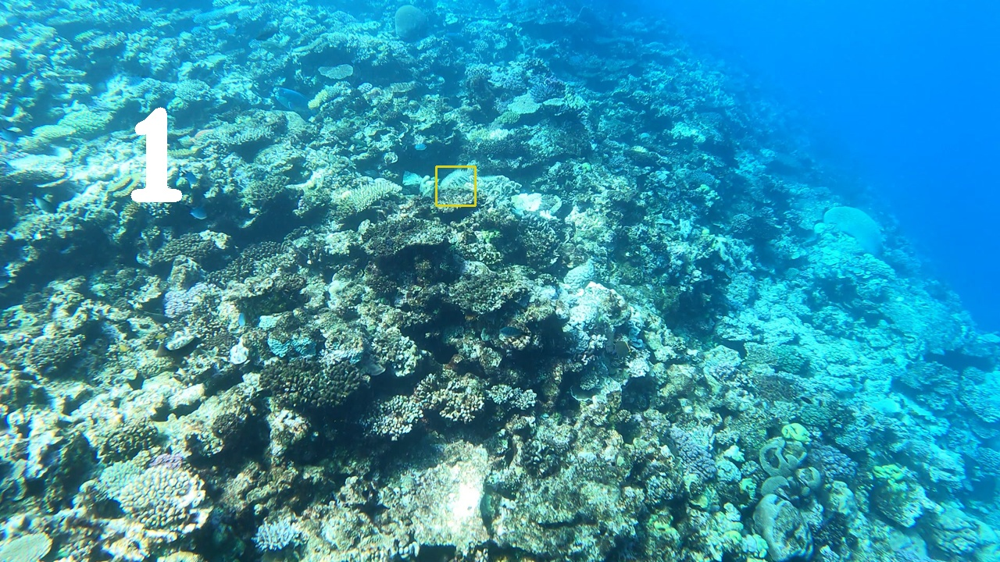

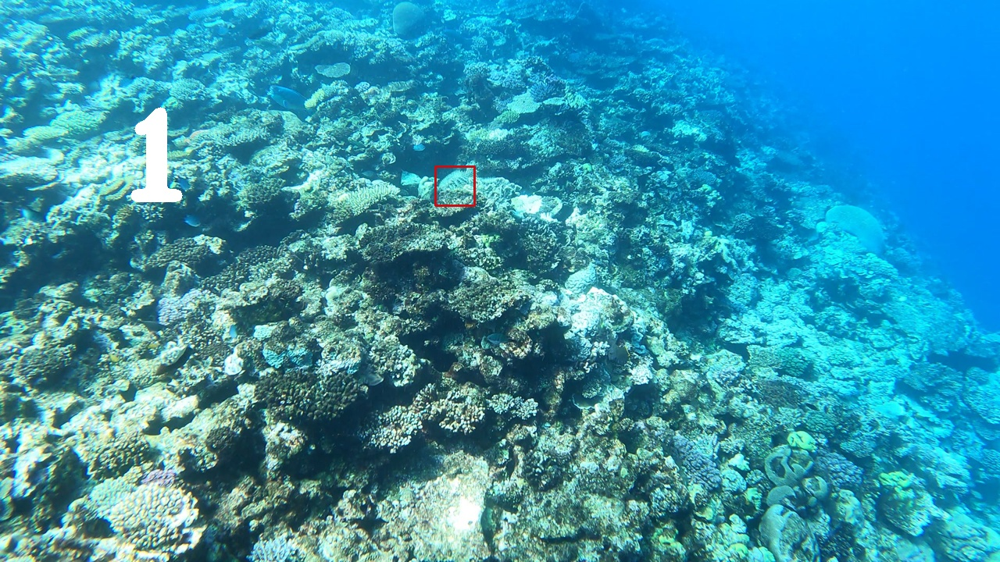

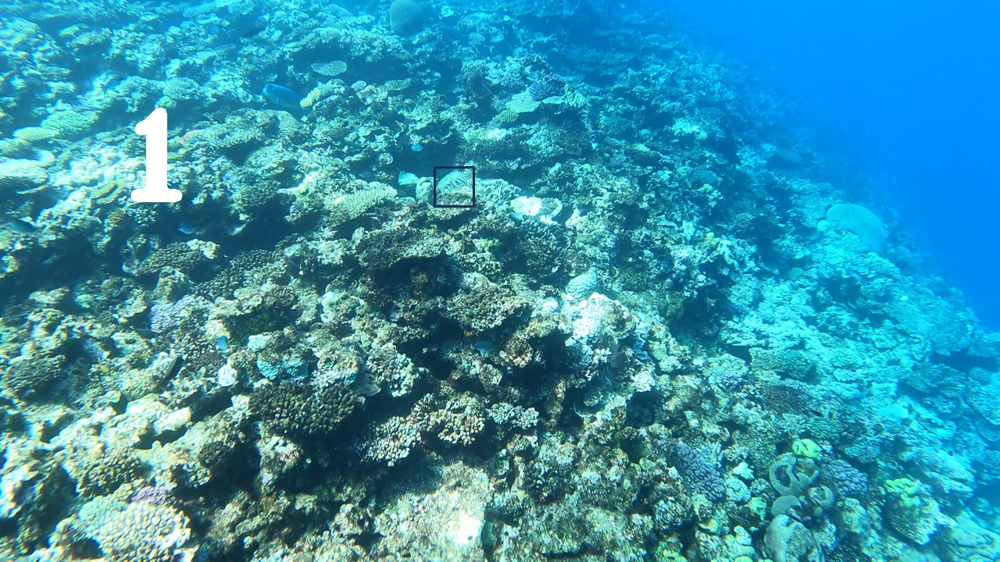

In [ ]:
from IPython.display import Image, display
for i in range (16, 20):
  display(Image(f'./COMP9517_project/vedio_imgs/{i}.jpg'))

#### Method 1: YOLOv5
- Randomly split the data, $60\%$ for training, $20\%$ for validation and $20\%$ for testing and also transfer the annotation data to *yolo* format.
1. Reorgnize the images according to the `train.csv` file and drop the images without COTS. Store them in `COMP9517_project/data`

In [11]:
!rm -rf COMP9517_project/data
!mkdir COMP9517_project/data

In [12]:
import os
import ast
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import shutil

In [13]:
df = pd.read_csv("./COMP9517_project/kaggle_data/train.csv")
new_df = df.copy(deep=True)

In [14]:
for i in range(df.shape[0]):
  new_filename = df.loc[i].at['image_id']
  dir_name = df.loc[i].at['image_id'].split('-')[0]
  old_filename = df.loc[i].at['image_id'].split('-')[1]
  if df.loc[i].at['annotations'] == '[]':
    new_df.drop(labels=i, axis=0,inplace=True)
  else:
    img = cv.imread('./COMP9517_project/kaggle_data/train_images/video_'+dir_name+'/'+old_filename+'.jpg')
    cv.imwrite(r'./COMP9517_project/data/'+new_filename+'.jpg', img)

In [ ]:
df

,video_id,sequence,video_frame,sequence_frame,image_id,annotations
0,0,40258,0,0,0-0,[]
1,0,40258,1,1,0-1,[]
2,0,40258,2,2,0-2,[]
3,0,40258,3,3,0-3,[]
4,0,40258,4,4,0-4,[]
...,...,...,...,...,...,...
23496,2,29859,10755,2983,2-10755,[]
23497,2,29859,10756,2984,2-10756,[]
23498,2,29859,10757,2985,2-10757,[]
23499,2,29859,10758,2986,2-10758,[]


In [ ]:
new_df = new_df.reset_index()
new_df

,index,video_id,sequence,video_frame,sequence_frame,image_id,annotations
0,16,0,40258,16,16,0-16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]"
1,17,0,40258,17,17,0-17,"[{'x': 558, 'y': 213, 'width': 50, 'height': 32}]"
2,18,0,40258,18,18,0-18,"[{'x': 557, 'y': 213, 'width': 50, 'height': 32}]"
3,19,0,40258,19,19,0-19,"[{'x': 556, 'y': 214, 'width': 50, 'height': 32}]"
4,20,0,40258,20,20,0-20,"[{'x': 555, 'y': 214, 'width': 50, 'height': 32}]"
...,...,...,...,...,...,...,...
4914,23369,2,29859,10628,2856,2-10628,"[{'x': 92, 'y': 532, 'width': 40, 'height': 37}]"
4915,23370,2,29859,10629,2857,2-10629,"[{'x': 78, 'y': 569, 'width': 40, 'height': 37}]"
4916,23371,2,29859,10630,2858,2-10630,"[{'x': 65, 'y': 606, 'width': 41, 'height': 37}]"
4917,23372,2,29859,10631,2859,2-10631,"[{'x': 51, 'y': 643, 'width': 44, 'height': 37}]"


In [ ]:
df = new_df.copy(deep=True)
df

,index,video_id,sequence,video_frame,sequence_frame,image_id,annotations
0,16,0,40258,16,16,0-16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]"
1,17,0,40258,17,17,0-17,"[{'x': 558, 'y': 213, 'width': 50, 'height': 32}]"
2,18,0,40258,18,18,0-18,"[{'x': 557, 'y': 213, 'width': 50, 'height': 32}]"
3,19,0,40258,19,19,0-19,"[{'x': 556, 'y': 214, 'width': 50, 'height': 32}]"
4,20,0,40258,20,20,0-20,"[{'x': 555, 'y': 214, 'width': 50, 'height': 32}]"
...,...,...,...,...,...,...,...
4914,23369,2,29859,10628,2856,2-10628,"[{'x': 92, 'y': 532, 'width': 40, 'height': 37}]"
4915,23370,2,29859,10629,2857,2-10629,"[{'x': 78, 'y': 569, 'width': 40, 'height': 37}]"
4916,23371,2,29859,10630,2858,2-10630,"[{'x': 65, 'y': 606, 'width': 41, 'height': 37}]"
4917,23372,2,29859,10631,2859,2-10631,"[{'x': 51, 'y': 643, 'width': 44, 'height': 37}]"


In [ ]:
df.annotations = df.annotations.apply(ast.literal_eval)
df = df.groupby("image_id")["annotations"].apply(list).reset_index(name="bboxes")

In [ ]:
print(df.loc[11].bboxes)
df.loc[11].bboxes[0][1].get('x')

[[{'x': 266, 'y': 659, 'width': 116, 'height': 60}, {'x': 640, 'y': 52, 'width': 22, 'height': 20}]]


640

In [ ]:
df

,image_id,bboxes
0,0-100,"[[{'x': 276, 'y': 631, 'width': 116, 'height':..."
1,0-1000,"[[{'x': 932, 'y': 336, 'width': 79, 'height': ..."
2,0-1001,"[[{'x': 938, 'y': 339, 'width': 81, 'height': ..."
3,0-1002,"[[{'x': 945, 'y': 342, 'width': 83, 'height': ..."
4,0-1003,"[[{'x': 951, 'y': 345, 'width': 85, 'height': ..."
...,...,...
4914,2-8866,"[[{'x': 444, 'y': 618, 'width': 62, 'height': ..."
4915,2-8867,"[[{'x': 440, 'y': 638, 'width': 64, 'height': ..."
4916,2-8868,"[[{'x': 438, 'y': 659, 'width': 64, 'height': ..."
4917,2-8869,"[[{'x': 437, 'y': 679, 'width': 64, 'height': ..."


3. Prepare folders for trian, val and test dataset in *yolo* format.

In [ ]:
%rm -rf COMP9517_project/cots_data
%mkdir COMP9517_project/cots_data
%mkdir COMP9517_project/cots_data/images
%mkdir COMP9517_project/cots_data/labels
%mkdir COMP9517_project/cots_data/images/train
%mkdir COMP9517_project/cots_data/images/val
%mkdir COMP9517_project/cots_data/images/test
%mkdir COMP9517_project/cots_data/labels/train
%mkdir COMP9517_project/cots_data/labels/val
%mkdir COMP9517_project/cots_data/labels/test

In [ ]:
!apt-get install tree

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 5 not upgraded.
Need to get 40.7 kB of archives.
After this operation, 105 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tree amd64 1.7.0-5 [40.7 kB]
Fetched 40.7 kB in 1s (45.1 kB/s)
Selecting previously unselected package tree.
(Reading database ... 123942 files and directories currently installed.)
Preparing to unpack .../tree_1.7.0-5_amd64.deb ...
Unpacking tree (1.7.0-5) ...
Setting up tree (1.7.0-5) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...


In [ ]:
!tree COMP9517_project/cots_data

COMP9517_project/cots_data
├── images
│   ├── test
│   ├── train
│   └── val
└── labels
    ├── test
    ├── train
    └── val

8 directories, 0 files


4. Get the width and height of the images for later usage

In [ ]:
img = cv.imread("./COMP9517_project/kaggle_data/train_images/video_0/0.jpg")
H = img.shape[0]
W = img.shape[1]
print(f"width:{W}, height:{H}")

width:1280, height:720


In [ ]:
# df_train:80%  df_test:20%
df_train, df_test = train_test_split(
    df,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

# df_train:80%*0.75=60%  df_test:20%
df_train, df_valid = train_test_split(
    df_train,
    test_size=0.25,
    random_state=42,
    shuffle=True
)

df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)
df_valid = df_valid.reset_index(drop=True)

In [ ]:
OUTPUT_PATH = "./COMP9517_project/cots_data/"
DATA_PATH = "./COMP9517_project/data"
def to_yolov5(data, data_type="train"):
  for _, row in tqdm(data.iterrows(), total=len(data)):
    image_name = row["image_id"]
    bounding_boxes = row["bboxes"]
    yolo_data = []
    for bbox in bounding_boxes[0]:
      x = bbox.get("x")
      y = bbox.get("y")
      w = bbox.get("width")
      h = bbox.get("height")
      x_center = x + w / 2.0
      y_center = y + h / 2.0
      x_center /= 1280.0
      y_center /= 720.0
      w /= 1280.0
      h /= 720.0
      yolo_data.append([0, x_center, y_center, w, h])
    yolo_data = np.array(yolo_data)
    np.savetxt(
        os.path.join(OUTPUT_PATH, f"labels/{data_type}/{image_name}.txt"),
        yolo_data,
        fmt=["%d", "%f", "%f", "%f", "%f"]
    )
    shutil.copyfile(
        os.path.join(DATA_PATH, f"{image_name}.jpg"),
        os.path.join(OUTPUT_PATH, f"images/{data_type}/{image_name}.jpg")
    )

In [ ]:
to_yolov5(df_train, data_type="train")
to_yolov5(df_valid, data_type="val")
to_yolov5(df_test, data_type="test")

100%|██████████| 984/984 [00:03<00:00, 276.34it/s]


### Model training

- Ready with the data.
- Next modify the `.yaml` file for *yolov5* and start training
- Note: if you have downloaded the yolov5 folder from the links provided at the top, do NOT install yolov5 again, for which will override the existing folder

In [20]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

Cloning into 'yolov5'...
remote: Enumerating objects: 14765, done.
remote: Counting objects: 100% (96/96), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 14765 (delta 53), reused 74 (delta 40), pack-reused 14669
Receiving objects: 100% (14765/14765), 13.54 MiB | 36.59 MiB/s, done.
Resolving deltas: 100% (10192/10192), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 6.1 MB/s 


Zip COMP9517_project and yolov5 folders and upload them to google drive.

Note: No need to execute this line.

In [ ]:
!zip -r './COMP9517_project.zip' './COMP9517_project'

流式输出内容被截断，只能显示最后 5000 行内容。
  adding: COMP9517_project/cots_data/images/val/1-3941.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/0-12307.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/0-4754.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/1-1997.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/1-4526.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/0-9376.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/1-9237.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/0-4554.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/1-8866.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/1-8993.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/0-9891.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/2-4732.jpg (deflated 0%)
  adding: COMP9517_project/cots_data/images/val/2-5790.jpg (deflated 0%)
  adding: COMP9517_proj

In [ ]:
import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.2-237-g55e9516 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 55.7/78.2 GB disk)


In [ ]:
%cd ./..

/content


- Download yolov5 folder from google drive

Note: Skip this line. If you want to use the completed yolov5 folder, download from the link provided at the top.

In [5]:
!unzip drive/MyDrive/yolov5.zip 

Archive:  drive/MyDrive/yolov5.zip
   creating: yolov5/
  inflating: yolov5/yolov5s.pt       
  inflating: yolov5/LICENSE          
   creating: yolov5/models/
  inflating: yolov5/models/tf.py     
  inflating: yolov5/models/experimental.py  
  inflating: yolov5/models/common.py  
   creating: yolov5/models/__pycache__/
  inflating: yolov5/models/__pycache__/yolo.cpython-37.pyc  
  inflating: yolov5/models/__pycache__/__init__.cpython-37.pyc  
  inflating: yolov5/models/__pycache__/experimental.cpython-37.pyc  
  inflating: yolov5/models/__pycache__/common.cpython-37.pyc  
   creating: yolov5/models/segment/
  inflating: yolov5/models/segment/yolov5s-seg.yaml  
  inflating: yolov5/models/segment/yolov5x-seg.yaml  
  inflating: yolov5/models/segment/yolov5m-seg.yaml  
  inflating: yolov5/models/segment/yolov5l-seg.yaml  
  inflating: yolov5/models/segment/yolov5n-seg.yaml  
  inflating: yolov5/models/yolov5s.yaml  
  inflating: yolov5/models/yolov5n.yaml  
   creating: yolov5/models/hub

- Resume from the last training

Note: This is the resume from the last training. Since the training is now completed, no need to execute this line.

In [9]:
!python ./yolov5/train.py --resume ./yolov5/runs/train/exp/weights/last.pt

train: weights=yolov5/yolov5s.pt, cfg=, data=yolov5/data/coco128.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=./yolov5/runs/train/exp/weights/last.pt, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 34, done.
remote: Counting objects: 100% (34/34), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 34 (delta 14), reused 22 (delta 9), pack-reused 0
Unpacking objects: 100% (34/34), done.
From https://github.com/ultralytics/yolov5
   55e9516..f33718f  master             -> origin/master
   1d81

- This is the initial training process. Since it has 300 epochs, I have to 
stop at 64 epoch and save the last.pt for later resuming.

In [22]:
!python ./yolov5/train.py --img 640 --batch 64 --epochs 300 --data COTS.yaml --cfg ./yolov5/models/yolov5m.yaml

train: weights=yolov5/yolov5s.pt, cfg=./yolov5/models/yolov5m.yaml, data=COTS.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=64, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-237-g55e9516 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=

- This code is to store yolov5 folder into google drive, which includes the last.pt file. If the process is to be resumed, unzip the yolov5.zip from google drive first, and then use !python train.py --resume ./***/last.pt

Note: you do not need to execute this line if you do NOT want to store the yolov5 file.

In [26]:
!cp yolov5.zip drive/MyDrive

### Visualization

- Use detect.py to predict the bounding boxes of the images

In [34]:
# For demo only, please skip this part
!rm -rf ./yolov5/runs/detect

In [35]:
# For demo only, please skip this part
!cp ./COMP9517_project/cots_data/images/test/0-1007.jpg ./COMP9517_project/cots_data/images/tiny_test
!cp ./COMP9517_project/cots_data/images/test/1-9109.jpg ./COMP9517_project/cots_data/images/tiny_test

!cp ./COMP9517_project/cots_data/labels/test/0-1007.txt ./COMP9517_project/cots_data/labels/tiny_test
!cp ./COMP9517_project/cots_data/labels/test/1-9109.txt ./COMP9517_project/cots_data/labels/tiny_test

detect: weights=['./yolov5/runs/train/exp/weights/best.pt'], source=./COMP9517_project/cots_data/images/tiny_test, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.9, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-237-g55e9516 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients
image 1/2 /content/COMP9517_project/cots_data/images/tiny_test/0-1007.jpg: 384x640 1 COTS, 22.0ms
image 2/2 /content/COMP9517_project/cots_data/images/tiny_test/1-9109.jpg: 384x640 10 COTSs, 21.8ms
Speed: 0.5ms pre-process, 21.9ms inference, 1.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov5/

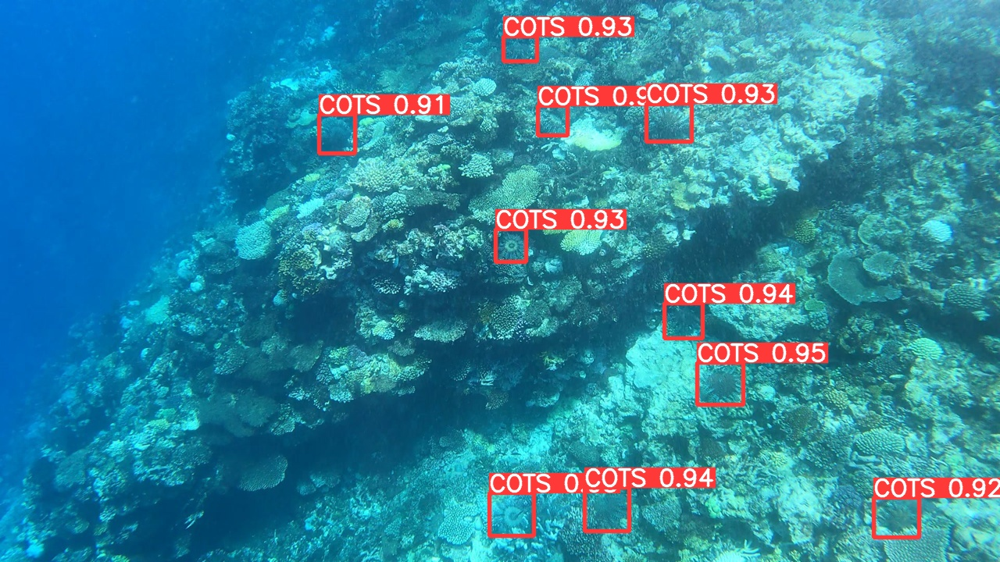

0-1007.jpg


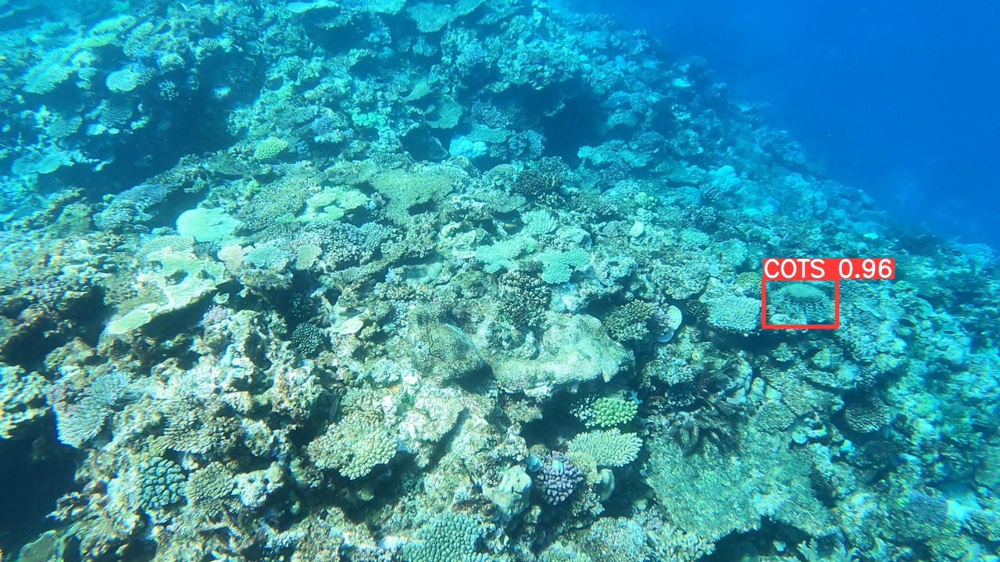

In [36]:
# For demo only, please skip this part
import os

!python ./yolov5/detect.py\
 --source ./COMP9517_project/cots_data/images/tiny_test\
 --weights ./yolov5/runs/train/exp/weights/best.pt\
 --conf 0.9\
 --iou 0.45\
 --img 640\
 --save-txt\
 --exist-ok

from IPython.display import Image, display
img_dir = './yolov5/runs/detect/exp/'
for img_name in os.listdir(img_dir):
  if '.jpg' not in img_name:
    continue
  print(img_name)    
  display(Image(f'./yolov5/runs/detect/exp/{img_name}'))

1-9109.jpg


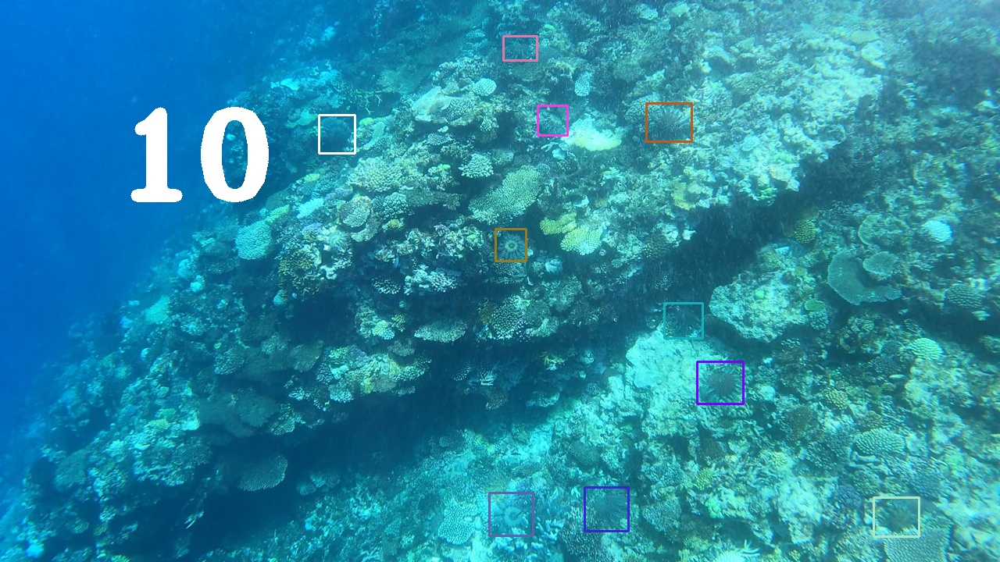

0-1007.jpg


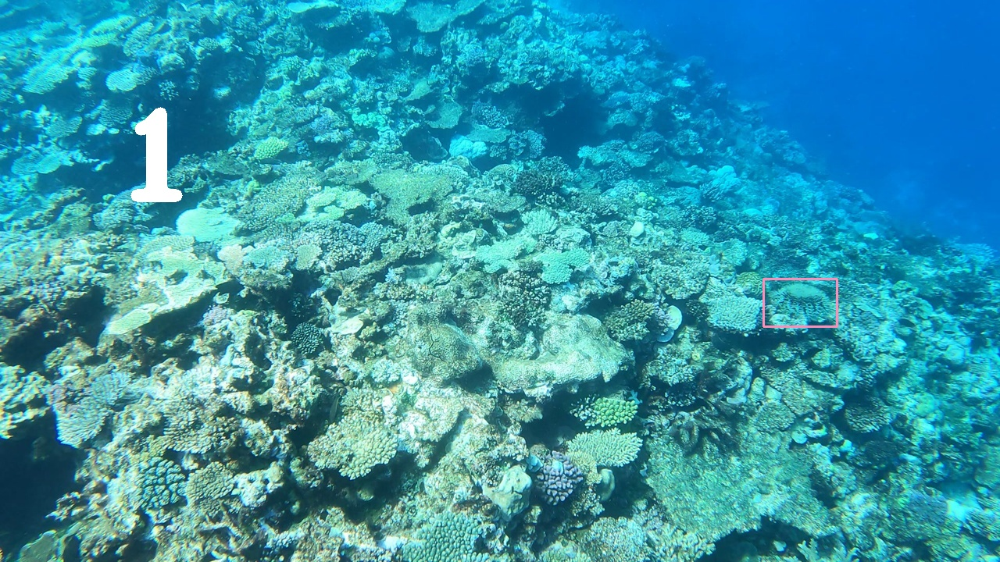

In [37]:
# For demo only, please skip this part
import os
import cv2 as cv
import random

!rm -rf ./COMP9517_project/predicted_imgs
!mkdir ./COMP9517_project/predicted_imgs

label_dir = './yolov5/runs/detect/exp/labels/'
x_ratio = 0
y_ratio = 0
w_ratio = 0
h_ratio = 0
for img_name in os.listdir(label_dir):
  with open(label_dir+img_name, 'r') as f:
    ratio_list = f.readlines()
  color_list = []
  img = cv.imread('./COMP9517_project/cots_data/images/test/'+img_name.split('.')[0]+'.jpg')
  for ratio in ratio_list:
    ratio = ratio.split(' ')
    x_ratio = float(ratio[1])
    y_ratio = float(ratio[2])
    w_ratio = float(ratio[3])
    h_ratio = float(ratio[4])
          
    # generate the random different color for each rectangle
    while True:
      r = random.randint(0, 255)
      g = random.randint(0, 255)
      b = random.randint(0, 255)
      color = [r, g, b]
      if color not in color_list:
          color_list.append(color)
          break
    w = int(w_ratio * 1280)
    h = int(h_ratio * 720)
    x = int(x_ratio * 1280) - int(w/2)
    y = int(y_ratio * 720) - int(h/2)
    cv.rectangle(img,(x,y),(x+w,y+h),color,2)
  cv.putText(img=img, text=f'{len(ratio_list)}', org=(150, 250), fontFace=cv.FONT_HERSHEY_TRIPLEX,
          fontScale=5, color=(255,255,255), thickness=15)
  cv.imwrite(r'./COMP9517_project/predicted_imgs/'+img_name.split('.')[0]+'.jpg', img)

from IPython.display import Image, display
predicted_img_dir = './COMP9517_project/predicted_imgs/'
count = 0
for img_name in os.listdir(predicted_img_dir):
  if count >= 5:
    break
  print(img_name)    
  display(Image(f'./COMP9517_project/predicted_imgs/{img_name}'))
  count += 1  

In [35]:
!rm -rf ./yolov5/runs/detect

In [36]:
!python ./yolov5/detect.py\
 --source ./COMP9517_project/cots_data/images/test\
 --weights ./yolov5/runs/train/exp/weights/best.pt\
 --conf 0.9\
 --iou 0.45\
 --img 640\
 --save-txt\
 --exist-ok

detect: weights=['./yolov5/runs/train/exp/weights/best.pt'], source=./COMP9517_project/cots_data/images/test, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.9, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-237-g55e9516 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients
image 1/984 /content/COMP9517_project/cots_data/images/test/0-1007.jpg: 384x640 1 COTS, 22.0ms
image 2/984 /content/COMP9517_project/cots_data/images/test/0-1010.jpg: 384x640 1 COTS, 21.9ms
image 3/984 /content/COMP9517_project/cots_data/images/test/0-1015.jpg: 384x640 1 COTS, 21.9ms
image 4/984 /content/COMP9517_pr

- Add bounding boxes to the predicted picture and show the number of the predicted fishes

In [40]:
!rm -rf ./COMP9517_project/predicted_imgs
!mkdir ./COMP9517_project/predicted_imgs

In [41]:
import os
import cv2 as cv

label_dir = './yolov5/runs/detect/exp/labels/'
x_ratio = 0
y_ratio = 0
w_ratio = 0
h_ratio = 0
for img_name in os.listdir(label_dir):
  with open(label_dir+img_name, 'r') as f:
    ratio_list = f.readlines()
  color_list = []
  img = cv.imread('./COMP9517_project/cots_data/images/test/'+img_name.split('.')[0]+'.jpg')
  for ratio in ratio_list:
    ratio = ratio.split(' ')
    x_ratio = float(ratio[1])
    y_ratio = float(ratio[2])
    w_ratio = float(ratio[3])
    h_ratio = float(ratio[4])
          
    # generate the random different color for each rectangle
    while True:
      r = random.randint(0, 255)
      g = random.randint(0, 255)
      b = random.randint(0, 255)
      color = [r, g, b]
      if color not in color_list:
          color_list.append(color)
          break
    w = int(w_ratio * 1280)
    h = int(h_ratio * 720)
    x = int(x_ratio * 1280) - int(w/2)
    y = int(y_ratio * 720) - int(h/2)
    cv.rectangle(img,(x,y),(x+w,y+h),color,2)
  cv.putText(img=img, text=f'{len(ratio_list)}', org=(150, 250), fontFace=cv.FONT_HERSHEY_TRIPLEX,
          fontScale=5, color=(255,255,255), thickness=15)
  cv.imwrite(r'./COMP9517_project/predicted_imgs/'+img_name.split('.')[0]+'.jpg', img)

- Show some predicted images

0-64.jpg


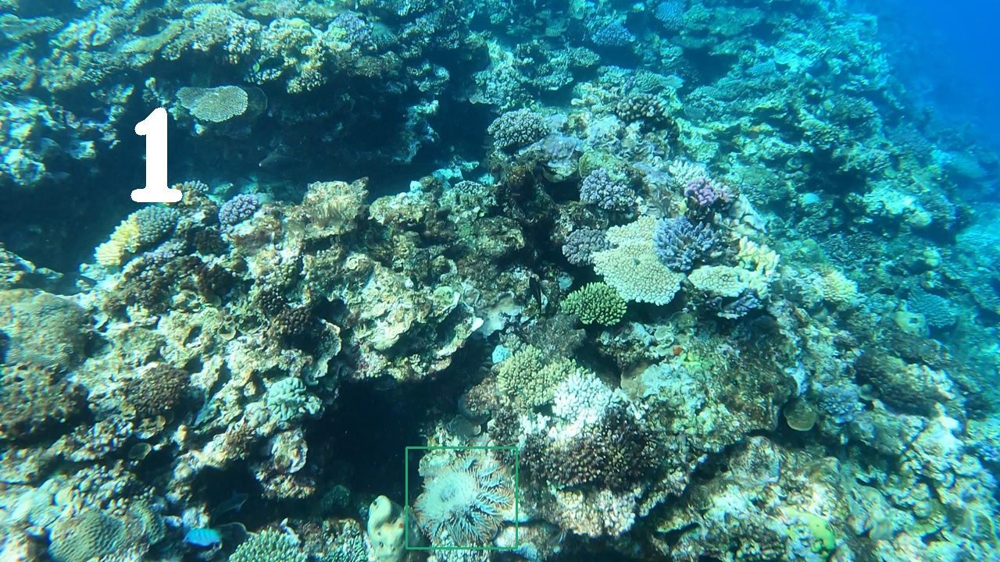

0-12234.jpg


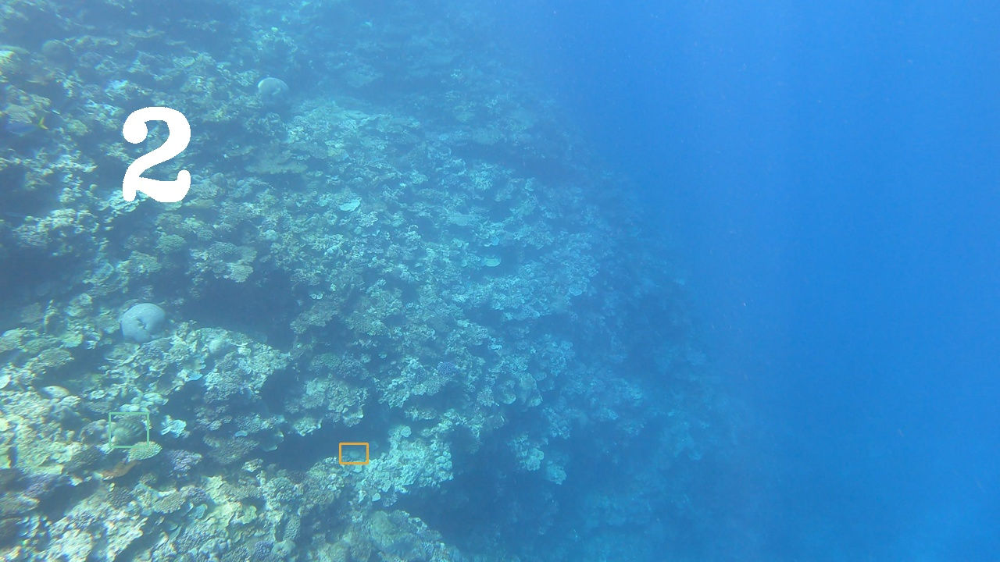

1-9109.jpg


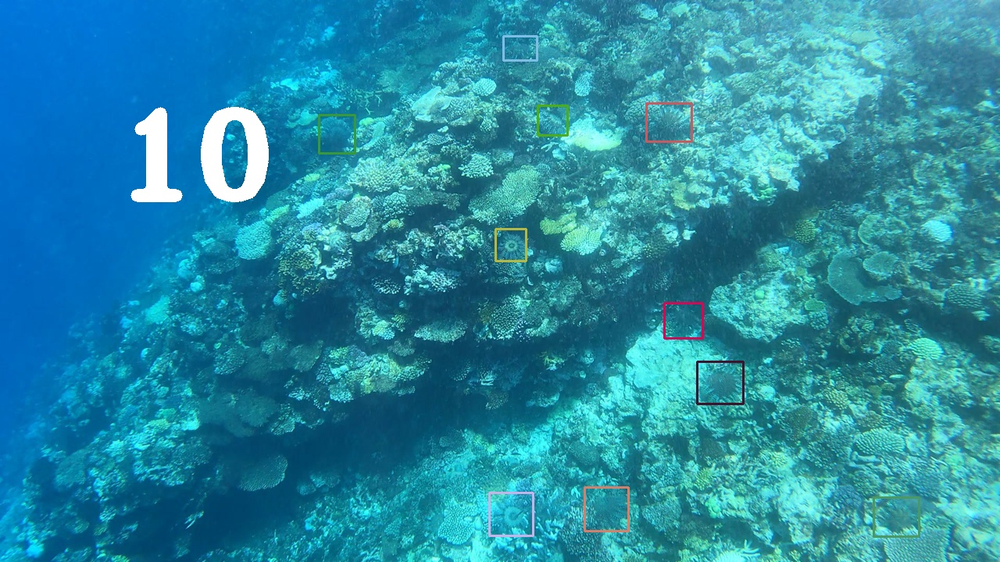

1-4485.jpg


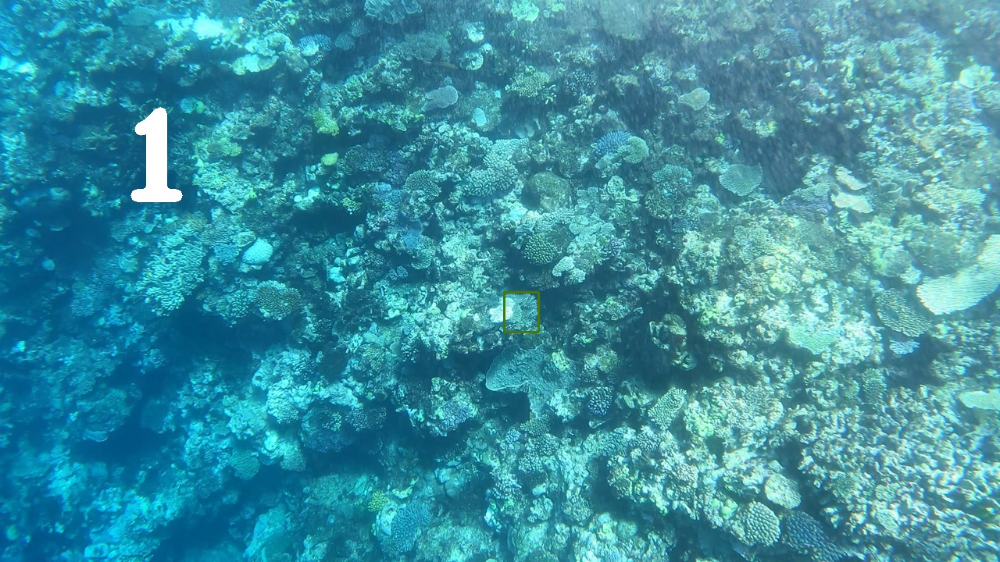

0-886.jpg


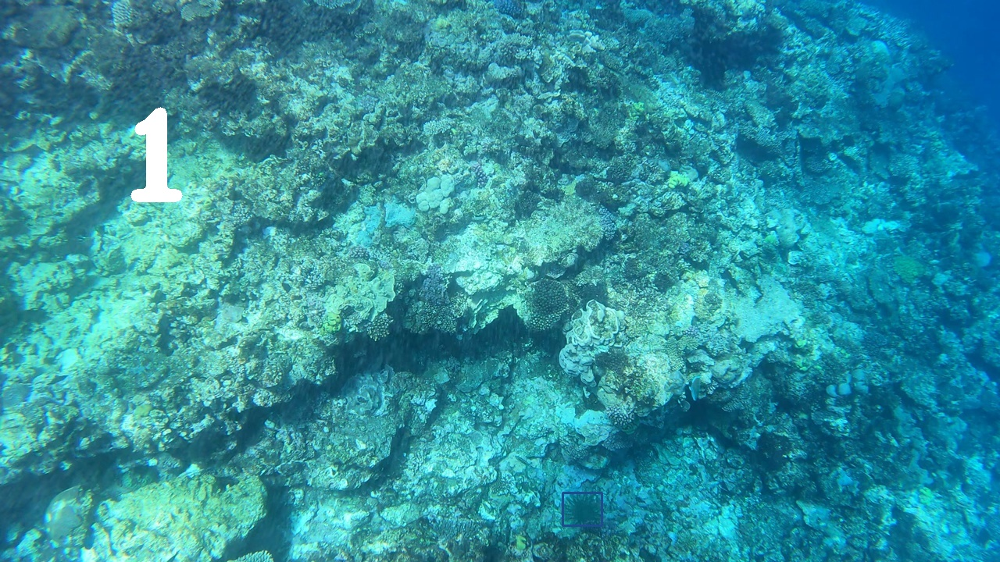

In [43]:
from IPython.display import Image, display
predicted_img_dir = './COMP9517_project/predicted_imgs/'
count = 0
for img_name in os.listdir(predicted_img_dir):
  if count >= 5:
    break
  print(img_name)    
  display(Image(f'./COMP9517_project/predicted_imgs/{img_name}'))
  count += 1

### Evaluation

- Since the best.pt has been trained from the above process, we now need to validate our model using val.py file

In [44]:
!rm -rf ./yolov5/runs/val

In [45]:
!python ./yolov5/val.py --data ./COTS.yaml\
    --weights ./yolov5/runs/train/exp/weights/best.pt\
    --imgsz 640\
    --conf 0.9\
    --iou 0.45\
    --save-txt\
    --save-conf\
    --exist-ok

val: data=./COTS.yaml, weights=['./yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.9, iou_thres=0.45, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=True, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=True, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.9 > 0.001 produces invalid results
YOLOv5 🚀 v6.2-237-g55e9516 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients
100% 755k/755k [00:00<00:00, 52.4MB/s]
val: Scanning '/content/COMP9517_project/cots_data/labels/val' images and labels...984 found, 0 missing, 0 empty, 0 corrupt: 100% 984/984 [00:00<00:00, 1192.80it/s]
val: New cache created: /content/COMP9517_project/cots_data/labels/val.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 31/31 [00:22<00:00,  1.3

- Save the yolov5 folder containing all val labels into google drive for later use
Note: skip this line if you do not want to save yolov5 folder

In [46]:
!zip -r ./drive/MyDrive/yolov5.zip ./yolov5

updating: yolov5/ (stored 0%)
updating: yolov5/yolov5s.pt (deflated 9%)
updating: yolov5/LICENSE (deflated 66%)
updating: yolov5/models/ (stored 0%)
updating: yolov5/models/tf.py (deflated 73%)
updating: yolov5/models/experimental.py (deflated 59%)
updating: yolov5/models/common.py (deflated 71%)
updating: yolov5/models/__pycache__/ (stored 0%)
updating: yolov5/models/__pycache__/yolo.cpython-37.pyc (deflated 49%)
updating: yolov5/models/__pycache__/__init__.cpython-37.pyc (deflated 26%)
updating: yolov5/models/__pycache__/experimental.cpython-37.pyc (deflated 45%)
updating: yolov5/models/__pycache__/common.cpython-37.pyc (deflated 57%)
updating: yolov5/models/segment/ (stored 0%)
updating: yolov5/models/segment/yolov5s-seg.yaml (deflated 60%)
updating: yolov5/models/segment/yolov5x-seg.yaml (deflated 60%)
updating: yolov5/models/segment/yolov5m-seg.yaml (deflated 60%)
updating: yolov5/models/segment/yolov5l-seg.yaml (deflated 60%)
updating: yolov5/models/segment/yolov5n-seg.yaml (defl

- Firstly, let's see how many images have bounding boxes after the prediction

In [47]:
print(len(os.listdir('./yolov5/runs/val/exp/labels')))

844


- Next, let's see how many images are for validation

In [50]:
print(len(os.listdir('./COMP9517_project/cots_data/labels/val')))

984


- We can observe that there are (984-844) = 140 images not having bounding boxes after the predcition. And we can regard these images as Fasle Negative (FN)
- Next, let's evaluate the F2 scores

In [4]:
# modified from https://www.kaggle.com/code/bamps53/competition-metric-implementation/notebook
def calc_iou(bboxes1, bboxes2):    
    bboxes1 = bboxes1.copy()
    bboxes2 = bboxes2.copy()    
    bboxes1[:, 2:] += bboxes1[:, :2]
    bboxes2[:, 2:] += bboxes2[:, :2]

    x11, y11, x12, y12 = np.split(bboxes1, 4, axis=1)
    x21, y21, x22, y22 = np.split(bboxes2, 4, axis=1)
    xA = np.maximum(x11, np.transpose(x21))
    yA = np.maximum(y11, np.transpose(y21))
    xB = np.minimum(x12, np.transpose(x22))
    yB = np.minimum(y12, np.transpose(y22))
    interArea = np.maximum((xB - xA + 1), 0) * np.maximum((yB - yA + 1), 0)
    boxAArea = (x12 - x11 + 1) * (y12 - y11 + 1)
    boxBArea = (x22 - x21 + 1) * (y22 - y21 + 1)
    iou = interArea / (boxAArea + np.transpose(boxBArea) - interArea)
    return iou

def F2(tp, fp, fn):
    return 5*tp / (5*tp + 4*fn+fp)

def get_tp_fp_fn_with_iou(gt_bboxes, pred_bboxes, iou_th, verbose=False):
    gt_bboxes = gt_bboxes.copy()
    pred_bboxes = pred_bboxes.copy()
    
    tp = 0
    fp = 0
    for k, pred_bbox in enumerate(pred_bboxes):
        ious = calc_iou(gt_bboxes, pred_bbox[None, 1:])
        max_iou = ious.max()
        if max_iou > iou_th:
            tp += 1
            gt_bboxes = np.delete(gt_bboxes, ious.argmax(), axis=0)
        else:
            fp += 1
        if len(gt_bboxes) == 0:
            fp += len(pred_bboxes) - (k + 1)
            break

    fn = len(gt_bboxes)
    return tp, fp, fn

def get_tp_fp_fn(gt_bboxes, pred_bboxes):
    if len(gt_bboxes) == 0 and len(pred_bboxes) == 0:
        tps, fps, fns = 0, 0, 0
        return tps, fps, fns
    
    elif len(gt_bboxes) == 0:
        tps, fps, fns = 0, len(pred_bboxes)*11, 0
        return tps, fps, fns
    
    elif len(pred_bboxes) == 0:
        tps, fps, fns = 0, 0, len(gt_bboxes)*11
        return tps, fps, fns
    
    pred_bboxes = pred_bboxes[pred_bboxes[:,0].argsort()[::-1]] # sort by conf
    
    tps, fps, fns = 0, 0, 0
    for iou_th in np.arange(0.3, 0.85, 0.05):
        tp, fp, fn = get_tp_fp_fn_with_iou(gt_bboxes, pred_bboxes, iou_th)
        tps += tp
        fps += fp
        fns += fn
    return tps, fps, fns

def calc_f2_score(gt_bboxes_list, pred_bboxes_list, verbose=False):
    tps, fps, fns = 0, 0, 0
    for gt_bboxes, pred_bboxes in zip(gt_bboxes_list, pred_bboxes_list):
        tp, fp, fn = get_tp_fp_fn(gt_bboxes, pred_bboxes)
        tps += tp
        fps += fp
        fns += fn
        if verbose:
            num_gt = len(gt_bboxes)
            num_pred = len(pred_bboxes)
            print(f'num_gt:{num_gt:<3} num_pred:{num_pred:<3} tp:{tp:<3} fp:{fp:<3} fn:{fn:<3}')
    return F2(tps, fps, fns)

In [7]:
import os
import numpy as np

# modified from https://www.kaggle.com/code/hyunmingu/evaluate-f2-score-for-yolov5-model/notebook
gt_bboxs_list, prd_bboxs_list = [], []
label_dir = './COMP9517_project/cots_data/labels/val/'
predict_dir = './yolov5/runs/val/exp/labels/'
count = 0
for image_file in os.listdir(label_dir):    
    gt_bboxs = []
    prd_bboxs = []
    with open(label_dir+image_file, 'r') as f:
        while True:
            r = f.readline().rstrip()
            if not r:
                break
            # get rid of the 1st element as it's the calss
            r = r.split()[1:]
            bbox = np.array(list(map(float, r)))
            gt_bboxs.append(bbox)
    if os.path.exists(predict_dir+image_file):
        with open(predict_dir+image_file, 'r') as f:
            while True:
                r = f.readline().rstrip()
                if not r:
                    break
                r = r.split()[1:]
                # move the confidence to the 1st place                
                r = [r[4], *r[:4]]
                bbox = np.array(list(map(float, r)))
                prd_bboxs.append(bbox)
    gt_bboxs, prd_bboxs = np.array(gt_bboxs), np.array(prd_bboxs)
    gt_bboxs_list.append(gt_bboxs)
    prd_bboxs_list.append(prd_bboxs)
    count += 1
print(f'{count} bound boxs appended to list')

984 bound boxs appended to list


In [10]:
score = calc_f2_score(gt_bboxs_list, prd_bboxs_list, verbose=True)

num_gt:10  num_pred:9   tp:99  fp:0   fn:11 
num_gt:2   num_pred:2   tp:22  fp:0   fn:0  
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:2   num_pred:2   tp:22  fp:0   fn:0  
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:11  num_pred:5   tp:55  fp:0   fn:66 
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:2   num_pred:1   tp:11  fp:0   fn:11 
num_gt:1   num_pred:1   tp:0   fp:11  fn:11 
num_gt:4   num_pred:3   tp:33  fp:0   fn:11 
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:3   num_pred:2   tp:22  fp:0   fn:11 
num_gt:2   num_pred:2   tp:22  fp:0   fn:0  
num_gt:2   num_pred:2   tp:22  fp:0   fn:0  
num_gt:3   num_pred:3   tp:33  fp:0   fn:0  
num_gt:1   num_pred:1   tp:11  fp:0   fn:0  
num_gt:1  

In [11]:
print(f'f2 score for validation set is {score}')

f2 score for validation set is 0.8019694968175813
